In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import torch
import torchvision
torch.manual_seed(0)

In [ ]:
#for images 1280*1024
import os
path2train='/content/drive/MyDrive/Diplom/Daphnia/new_dataset/frames'
path2label='/content/drive/MyDrive/Diplom/Daphnia/new_dataset/heatmaps'

train_data=[i for i in os.listdir(path2train)]
label_data=[i for i in os.listdir(path2label)]

train_data = sorted(train_data, key=lambda x: x[7:10])
label_data = sorted(label_data, key=lambda x: x[7:10])


In [ ]:
#for images size 64*64
import os
path2train= '/content/drive/MyDrive/Diplom/Daphnia/X'
path2label= '/content/drive/MyDrive/Diplom/Daphnia/y'
path2test = '/content/drive/MyDrive/Diplom/Daphnia/Test/X'

train_data=[i for i in os.listdir(path2train)]
label_data=[i for i in os.listdir(path2label)]
test_data = [i for i in os.listdir(path2test)]

train_data = sorted(train_data, key=lambda x: x[3:5])
label_data = sorted(label_data, key=lambda x: x[3:5])

In [ ]:
print('number of images:', len(train_data))
print('number of label imgs:', len(label_data))

number of images: 200
number of label imgs: 200


In [ ]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu101/torch1.6.0/index.html
!rm -rf mmsegmentation
!git clone https://github.com/open-mmlab/mmsegmentation.git 
%cd mmsegmentation
!pip install -e .

Looking in links: https://download.openmmlab.com/mmcv/dist/cu101/torch1.6.0/index.html
     |████████████████████████████████| 46.9 MB 76 kB/s 
     |████████████████████████████████| 185 kB 12.7 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 5504, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 5504 (delta 1), reused 0 (delta 0), pack-reused 5489
Receiving objects: 100% (5504/5504), 11.96 MiB | 7.80 MiB/s, done.
Resolving deltas: 100% (4026/4026), done.
/content/mmsegmentation
Obtaining file:///content/mmsegmentation
  Running setup.py develop for mmsegmentation


In [ ]:
import numpy as np
np.random.seed(111)
img_random= np.random.choice(train_data,4)
#tst_random = np.random.choice(test_data,4)
img_random

array(['0000000084.png', '0000000108.png', '0000000086.png',
       '0000000019.png'], dtype='<U14')

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage as ndi 
from skimage.segmentation import  mark_boundaries


In [ ]:
def show_img_mask(img, mask):     #### Вспомогательная функция , которая очерчивает контуры
    if torch.is_tensor(img):
        img=to_pil_image(img)
        mask=to_pil_image(mask)
        
    img_mask=mark_boundaries(np.array(img), 
                        np.array(mask),
                        outline_color=(0,1,0),
                        color=(0,1,0))
    plt.imshow(img_mask)

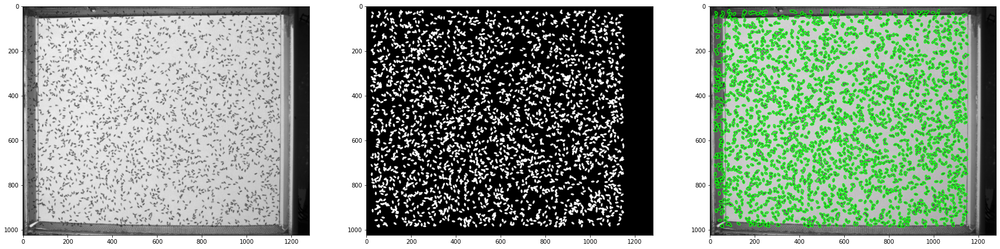

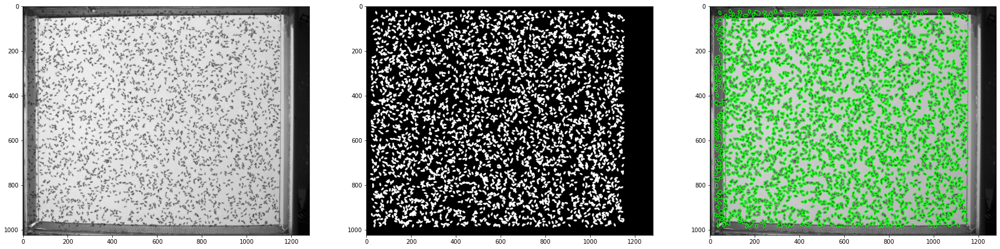

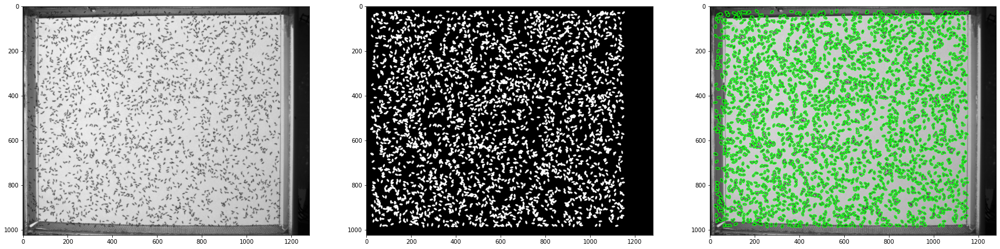

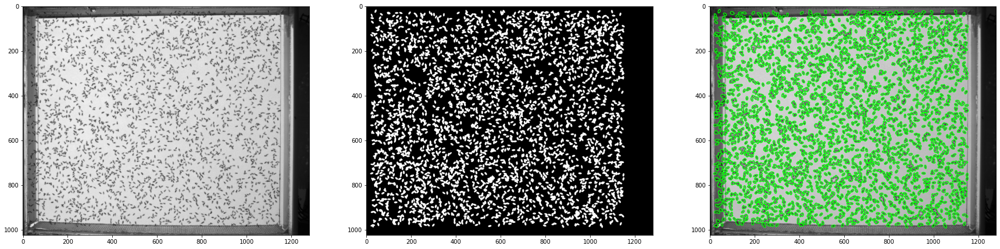

In [ ]:
plt.rcParams["figure.figsize"] = (30,30)
for i in img_random:
  path2img = os.path.join(path2train,i)
  path2lbl = os.path.join(path2label,i)
  path2lbl= path2lbl.replace('src', 'dst')
  img = Image.open(path2img)
  annt_edges = Image.open(path2lbl)
  mask = ndi.binary_fill_holes(annt_edges)
  
  plt.figure()
  plt.subplot(1,3,1)
  plt.imshow(img,cmap = 'gray')

  plt.subplot(1,3,2)
  plt.imshow(mask,cmap = 'gray')

  plt.subplot(1,3,3)
  show_img_mask(img,mask)

In [ ]:
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor,ToPILImage,Compose
from torchvision.transforms.functional import to_tensor,to_pil_image

In [ ]:
from albumentations import CenterCrop, Compose
transform_train= Compose([CenterCrop(256,256)])

In [ ]:
#for images size of 1280*1024
class daph_dataset(Dataset):
  def __init__(self,path2train,transform = None):
    imgsList = [i for i in os.listdir(path2train)]
    imgsList = sorted(imgsList, key = lambda x : x[7:10])
    lbl_list=[i for i in os.listdir(path2label)]
    lbl_list=sorted(lbl_list, key= lambda x: x[7:10])
    self.path2imgs = [os.path.join(path2train,fn) for fn in imgsList]
    self.path2lbl= [ os.path.join(path2label,fn) for fn in lbl_list]
    #self.path2lbl= [p2i.replace('X/src', 'y/dst') for p2i in self.path2imgs]
    self.transform = transform
  
  def __len__(self):
    return len(self.path2imgs)
  
  def __getitem__(self, idx):
    path2img = self.path2imgs[idx]
    image = Image.open(path2img)

    path2annt =  self.path2lbl[idx]
    annts_edges = Image.open(path2annt)
    mask = np.array(annts_edges)
    image = np.array(image)
    mask=mask.astype("uint8") 
    if self.transform:
      augmented = self.transform(image = image,mask = mask)
      image = augmented['image']
      mask = augmented['mask']
    image = to_tensor(image)
    mask = to_tensor(mask)
    return image,mask

In [ ]:
class daph_dataset(Dataset):
  def __init__(self,path2train,transform = None):
    imgsList = [i for i in os.listdir(path2train)]
    imgsList = sorted(imgsList, key = lambda x : x[3:5])
    self.path2imgs = [os.path.join(path2train,fn) for fn in imgsList]
    self.path2lbl= [p2i.replace('X/src', 'y/dst') for p2i in self.path2imgs]
    self.transform = None
  
  def __len__(self):
    return len(self.path2imgs)
  
  def __getitem__(self, idx):
    path2img = self.path2imgs[idx]
    image = Image.open(path2img)

    path2annt =  self.path2lbl[idx]
    annts_edges = Image.open(path2annt)
    mask = np.array(annts_edges)
    image = np.array(image)
    mask=mask.astype("uint8") 
  
    image = to_tensor(image)
    mask = 255*to_tensor(mask)
    return image,mask


SyntaxError: ignored

In [ ]:
daph_ds1 = daph_dataset(path2train,transform = None)
print(len(daph_ds1))

200


In [ ]:
img,mask=daph_ds1[5]
print(img.shape, img.type(),torch.max(img))
print(mask.shape, mask.type(),torch.max(mask))

torch.Size([1, 1024, 1280]) torch.FloatTensor tensor(0.9020)
torch.Size([1, 1024, 1280]) torch.FloatTensor tensor(1.)


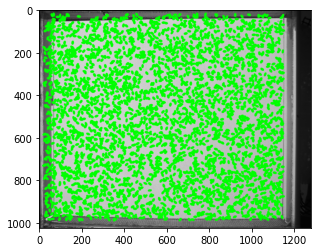

In [ ]:
show_img_mask(img,mask)

In [ ]:
from sklearn.model_selection import ShuffleSplit
sss = ShuffleSplit(n_splits = 1 , test_size = 0.11 , random_state = 0)
indices = range(len(daph_ds1))
for train_index,val_index in  sss.split(indices):
  print(len(train_index))
  print("--"*10)
  print(len(val_index))

178
--------------------
22


In [ ]:
from torch.utils.data import Subset
train_ds = Subset(daph_ds1,train_index)
print(len(train_ds))
val_ds = Subset(daph_ds1,val_index)
print(len(val_ds))

178
22


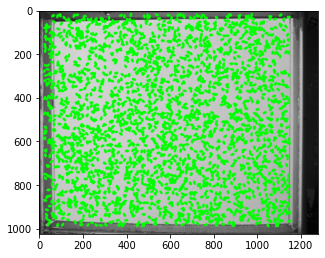

In [ ]:
plt.figure(figsize=(5,5))
for img,mask in train_ds:
  show_img_mask(img,mask)
  break

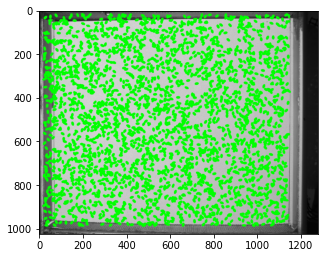

In [ ]:
plt.figure(figsize=(5,5))
for img,mask in val_ds:
  show_img_mask(img,mask)
  break

In [ ]:
from torch.utils.data import DataLoader
train_dl = DataLoader(train_ds,batch_size = 4 , shuffle = True)
val_dl = DataLoader(val_ds,batch_size = 4 , shuffle = False)

In [ ]:
for img_b,mask_b in train_dl:
  print(img_b.shape,img_b.dtype)
  print(mask_b.shape,mask_b.dtype)
  break

torch.Size([4, 1, 1024, 1280]) torch.float32
torch.Size([4, 1, 1024, 1280]) torch.float32


In [ ]:
for img_b,mask_b in val_dl:
  print(img_b.shape,img_b.dtype)
  print(mask_b.shape,mask_b.dtype)
  break

torch.Size([4, 1, 1024, 1280]) torch.float32
torch.Size([4, 1, 1024, 1280]) torch.float32


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class SegNet(nn.Module):
  def __init__(self,params):
    super(SegNet,self).__init__()
    C_in,H_in,W_in = params['input_shape']
    init_f = params['initial_filters']
    num_outputs = params['num_outputs']
    self.conv1 = nn.Conv2d(C_in,init_f,kernel_size=3,stride=1,padding = 1)
    self.conv2 = nn.Conv2d(init_f,init_f*2,kernel_size=3,stride=1,padding = 1)
    self.conv3 = nn.Conv2d(2*init_f,init_f*4,kernel_size=3,stride=1,padding = 1)
    self.conv4 = nn.Conv2d(4*init_f,init_f*8,kernel_size=3,stride=1,padding = 1)
    self.conv5 = nn.Conv2d(8*init_f,init_f*16,kernel_size=3,stride=1,padding = 1)

    self.upsample = nn.Upsample(scale_factor= 2 , mode = 'bilinear' , align_corners= True)

    self.conv_up1 = nn.Conv2d(16*init_f,8*init_f,kernel_size=3,padding=1)
    self.conv_up2 = nn.Conv2d(8*init_f,4*init_f,kernel_size=3,padding=1)
    self.conv_up3 = nn.Conv2d(4*init_f,2*init_f,kernel_size=3,padding=1)
    self.conv_up4 = nn.Conv2d(2*init_f,init_f,kernel_size=3,padding=1)

    self.conv_out = nn.Conv2d(init_f,num_outputs,kernel_size=3,padding = 1)
  
  def forward(self,x):
    x = F.relu(self.conv1(x))
    x = F.max_pool2d(x,2,2)

    x = F.relu(self.conv2(x))
    x = F.max_pool2d(x,2,2)

    x = F.relu(self.conv3(x))
    x = F.max_pool2d(x,2,2)

    x = F.relu(self.conv4(x))
    x = F.max_pool2d(x,2,2)

    x = F.relu(self.conv5(x))

    x = self.upsample(x)
    x = F.relu(self.conv_up1(x))

    x = self.upsample(x)
    x = F.relu(self.conv_up2(x))

    x = self.upsample(x)
    x = F.relu(self.conv_up3(x))

    x = self.upsample(x)
    x = F.relu(self.conv_up4(x))

    x = self.conv_out(x)
    return x

In [ ]:
class SegNet(nn.Module):
  def __init__(self,params):
    super(SegNet,self).__init__()
    C_in,H_in,W_in = params['input_shape']
    init_f = params['initial_filters']
    num_outputs = params['num_outputs']
    self.conv1 = nn.Sequential(nn.Conv2d(in_channels = C_in ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f),
                               nn.Conv2d(in_channels = init_f, out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f))
    self.conv2 = nn.Sequential(nn.Conv2d(in_channels = init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f),
                               nn.Conv2d(in_channels = 2*init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f))
    self.conv3 = nn.Sequential(nn.Conv2d(in_channels = 2*init_f ,out_channels = 4*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(4*init_f),
                               nn.Conv2d(in_channels = 4*init_f ,out_channels = 4*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(4*init_f))

    self.upsample = nn.Upsample(scale_factor= 2 , mode = 'bilinear' , align_corners= True)

    self.conv_up1 = nn.Sequential(nn.Conv2d(in_channels = 4*init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f),
                                  nn.Conv2d(in_channels = 2*init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f))
    self.conv_up2 = nn.Sequential(nn.Conv2d(in_channels = 2*init_f ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f),
                                  nn.Conv2d(in_channels = init_f ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f))

    self.conv_out = nn.Conv2d(init_f,num_outputs,kernel_size=3,padding = 1)
  
  def forward(self,x):
   
    x = self.conv1(x)
    x = F.max_pool2d(x,2,2)
  
    x = self.conv2(x)
    x = F.max_pool2d(x,2,2)
  
    x = self.conv3(x)
    x = F.max_pool2d(x,2,2)
   
    x = self.upsample(x)
    x = self.conv_up1(x)
   
    x = self.upsample(x)
    x = self.conv_up2(x)
   
    x = self.upsample(x)

    x = self.conv_out(x)
    x = torch.sigmoid(x)
    return x

In [ ]:

class SegNet(nn.Module):
  def __init__(self,params):
    super(SegNet,self).__init__()
    C_in,H_in,W_in = params['input_shape']
    init_f = params['initial_filters']
    num_outputs = params['num_outputs']
    self.conv1 = nn.Sequential(nn.Conv2d(in_channels = C_in ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f),nn.Conv2d(in_channels = init_f ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f))
    self.conv2 = nn.Sequential(nn.Conv2d(in_channels = init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f),nn.Conv2d(in_channels = 2*init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f))
    self.conv3 = nn.Sequential(nn.Conv2d(in_channels = 2*init_f ,out_channels = 4*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(4*init_f),nn.Conv2d(in_channels = 4*init_f ,out_channels = 4*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(4*init_f))

    self.upsample1 = nn.ConvTranspose2d(in_channels = 4*init_f , out_channels = 2*init_f , kernel_size=2 , stride =2 ,  padding=0)
    self.conv_up1 = nn.Sequential(nn.Conv2d(in_channels = 4*init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f),nn.Conv2d(in_channels = 2*init_f ,out_channels = 2*init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(2*init_f))
    self.upsample2 = nn.ConvTranspose2d(in_channels = 2*init_f , out_channels = init_f , kernel_size=2 , stride =2 ,  padding=0)
    self.conv_up2 = nn.Sequential(nn.Conv2d(in_channels = 2*init_f ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f),nn.Conv2d(in_channels = init_f ,out_channels = init_f , kernel_size = 3 , padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f))

    self.upsample3 = nn.ConvTranspose2d(in_channels = init_f , out_channels = init_f , kernel_size=2 , stride =2 ,  padding=0)
    self.conv_out = nn.Sequential(nn.Conv2d(2*init_f,init_f,kernel_size=3,padding = 1),nn.ReLU(), nn.BatchNorm2d(init_f),nn.Conv2d(in_channels = init_f ,out_channels = num_outputs , kernel_size = 3 , padding = 1))
  
  def forward(self,x):
    e10 = self.conv1(x)
    e1 = F.max_pool2d(e10,2,2)  # 1024x1280 ->> 521x640 (init_f)
    
    e2 = self.conv2(e1)
    e2 = F.max_pool2d(e2,2,2)  # 512x640 ->> 256x320   (2init_f)
    
    e3 = self.conv3(e2)
    e3 = F.max_pool2d(e3,2,2)  # 256x320 ->> 128x160   (4init_f) 

    d1 = self.upsample1(e3)
    d1 = self.conv_up1(torch.cat([e2,d1],1))
   
    d2 = self.upsample2(d1)  
    d2 = self.conv_up2(torch.cat([e1,d2],1))
    
    d3 = self.upsample3(d2)   

    out = self.conv_out(torch.cat([e10,d3],1))
    output = torch.sigmoid(out)
    return output

In [ ]:
h,w = 1024,1280
params_model = {"input_shape":(1,h,w),
                "initial_filters" : 16,
                "num_outputs" : 1}

In [ ]:
model = SegNet(params_model)

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)

In [ ]:
print(model)

SegNet(
  (conv1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(

In [ ]:
from torchsummary import summary
summary(model,input_size = (1,h,w) )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1       [-1, 16, 1024, 1280]             160
              ReLU-2       [-1, 16, 1024, 1280]               0
       BatchNorm2d-3       [-1, 16, 1024, 1280]              32
            Conv2d-4       [-1, 16, 1024, 1280]           2,320
              ReLU-5       [-1, 16, 1024, 1280]               0
       BatchNorm2d-6       [-1, 16, 1024, 1280]              32
            Conv2d-7         [-1, 32, 512, 640]           4,640
              ReLU-8         [-1, 32, 512, 640]               0
       BatchNorm2d-9         [-1, 32, 512, 640]              64
           Conv2d-10         [-1, 32, 512, 640]           9,248
             ReLU-11         [-1, 32, 512, 640]               0
      BatchNorm2d-12         [-1, 32, 512, 640]              64
           Conv2d-13         [-1, 64, 256, 320]          18,496
             ReLU-14         [-1, 64, 2

In [ ]:
def dice_loss(pred,target,smooth = 1e-5):
  intersection = (pred*target).sum(dim = (2,3))
  union = pred.sum(dim = (2,3)) + target.sum(dim = (2,3))
  dice = 2.0 * (intersection + smooth) / (union + smooth)
  loss = 1.0 - dice
  return loss.sum() , dice.sum()

In [ ]:
def loss_func(pred,target):
  bce = F.binary_cross_entropy_with_logits(pred,target,reduction = 'sum')
  pred = torch.sigmoid(pred)
  dlv,_ = dice_loss(pred,target)
  loss = bce + dlv
  return loss

In [ ]:
def loss_func(pred,target):
  bce = F.binary_cross_entropy(pred,target,reduction = 'sum')
  dlv,_ = dice_loss(pred,target)
  loss = bce + dlv
  return loss

In [ ]:
from mmseg.models.losses import LovaszLoss
loss_func = LovaszLoss(loss_type='binary' , reduction='sum' , per_image=True)
loss_func(torch.Tensor([1,2,3]),torch.Tensor([1,2,-44]))

tensor(268.)

In [ ]:
def metrics_batch(pred,target):
  #pred = torch.sigmoid(pred)
  _,metric = dice_loss(pred,target)
  return metric

In [ ]:
def loss_batch(loss_func, output, target, opt=None):   
    loss = loss_func(output, target)
    
    with torch.no_grad():
        #pred = torch.sigmoid(output)
        pred = output
        _, metric_b = dice_loss(pred, target)
    
    if opt is not None:
        opt.zero_grad()
        loss.backward()
        opt.step()

    return loss.item(), metric_b

In [ ]:
from torch import optim
opt = optim.Adam(model.parameters(), lr = 3e-4)

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
lr_scheduler = ReduceLROnPlateau(opt, mode = 'min' , factor = 0.5 , patience = 20 , verbose = 1)

In [ ]:
def get_lr(opt):
    for param_group in opt.param_groups:
        return param_group['lr']

current_lr=get_lr(opt)
print('current lr={}'.format(current_lr))

current lr=0.0003


In [ ]:
def loss_epoch(model,loss_func,dataset_dl,sanity_check=False,opt=None):
    running_loss=0.0
    running_metric=0.0
    len_data=len(dataset_dl.dataset)

    for xb, yb in dataset_dl:
        xb=xb.to(device)
        yb=yb.to(device)
        
        output=model(xb)
        loss_b, metric_b=loss_batch(loss_func, output, yb, opt)
        running_loss += loss_b
        
        if metric_b is not None:
            running_metric+=metric_b

        if sanity_check is True:
            break
    
    loss=running_loss/float(len_data)
    
    metric=running_metric/float(len_data)
    
    return loss, metric

In [ ]:
import copy
def train_val(model, params):
    num_epochs=params["num_epochs"]
    loss_func=params["loss_func"]
    opt=params["optimizer"]
    train_dl=params["train_dl"]
    val_dl=params["val_dl"]
    sanity_check=params["sanity_check"]
    lr_scheduler=params["lr_scheduler"]
    path2weights=params["path2weights"]
    
    loss_history={
        "train": [],
        "val": []}
    
    metric_history={
        "train": [],
        "val": []}    
    
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss=float('inf')    
    
    for epoch in range(num_epochs):
        current_lr=get_lr(opt)
        print('Epoch {}/{}, current lr={}'.format(epoch, num_epochs - 1, current_lr))   

        model.train()
        train_loss, train_metric=loss_epoch(model,loss_func,train_dl,sanity_check,opt)

        loss_history["train"].append(train_loss)
        metric_history["train"].append(train_metric)
        
        model.eval()
        with torch.no_grad():
            val_loss, val_metric=loss_epoch(model,loss_func,val_dl,sanity_check)
       
        loss_history["val"].append(val_loss)
        metric_history["val"].append(val_metric)   
        
        if val_loss < best_loss:
            best_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            
            torch.save(model.state_dict(), path2weights)
            print("Copied best model weights!")
            
        lr_scheduler.step(val_loss)
        if current_lr != get_lr(opt):
            print("Loading best model weights!")
            model.load_state_dict(best_model_wts) 
            
        print("train loss: %.6f, dice: %.2f" %(train_loss,100*train_metric))
        print("val loss: %.6f, dice: %.2f" %(val_loss,100*val_metric))
        print("-"*10) 
        

    model.load_state_dict(best_model_wts)
    return model, loss_history, metric_history

In [ ]:
path2models = './models/'
if not os.path.exists(path2models):
  os.mkdir(path2models)

In [ ]:
%time
params_train={
"num_epochs": 100,
"optimizer": opt,
"loss_func": loss_func,
"train_dl": train_dl,
"val_dl": val_dl,
"sanity_check": False,
"lr_scheduler": lr_scheduler,
"path2weights": path2models+"weights.pt",
}

CPU times: user 5 µs, sys: 1 µs, total: 6 µs
Wall time: 11.9 µs


In [ ]:
from google.colab import files
files.download("./models/weights.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
torch.cuda.empty_cache()
model,loss_hist,metric_hist=train_val(model,params_train)

Epoch 0/99, current lr=0.0003
Copied best model weights!
train loss: 1.429235, dice: 21.73
val loss: 1.344567, dice: 18.09
----------
Epoch 1/99, current lr=0.0003
Copied best model weights!
train loss: 1.295023, dice: 32.38
val loss: 1.222920, dice: 38.04
----------
Epoch 2/99, current lr=0.0003
Copied best model weights!
train loss: 1.182607, dice: 41.31
val loss: 1.144337, dice: 44.66
----------
Epoch 3/99, current lr=0.0003
Copied best model weights!
train loss: 1.119705, dice: 47.17
val loss: 1.089631, dice: 49.49
----------
Epoch 4/99, current lr=0.0003
Copied best model weights!
train loss: 1.078838, dice: 51.56
val loss: 1.064188, dice: 53.63
----------
Epoch 5/99, current lr=0.0003
Copied best model weights!
train loss: 1.051270, dice: 54.89
val loss: 1.043792, dice: 55.81
----------
Epoch 6/99, current lr=0.0003
Copied best model weights!
train loss: 1.031244, dice: 57.34
val loss: 1.023734, dice: 58.05
----------
Epoch 7/99, current lr=0.0003
Copied best model weights!
train

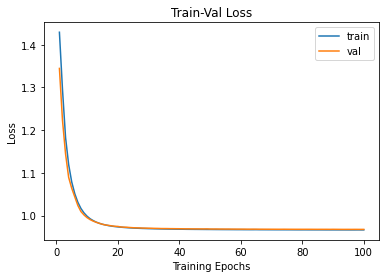

In [ ]:

num_epochs=params_train["num_epochs"]

plt.title("Train-Val Loss")
plt.plot(range(1,num_epochs+1),loss_hist["train"],label="train")
plt.plot(range(1,num_epochs+1),loss_hist["val"],label="val")
plt.ylabel("Loss")
plt.xlabel("Training Epochs")
plt.legend()
plt.show()

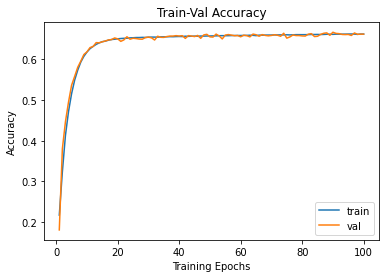

In [ ]:
plt.title("Train-Val Accuracy")
plt.plot(range(1,num_epochs+1),metric_hist["train"],label="train")
plt.plot(range(1,num_epochs+1),metric_hist["val"],label="val")
plt.ylabel("Accuracy")
plt.xlabel("Training Epochs")
plt.legend()
plt.show()

In [ ]:
test_ds = img_random

In [ ]:
path2weights = './models/weights.pt'
model.load_state_dict(torch.load(path2weights))
model.eval()

SegNet(
  (conv1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(

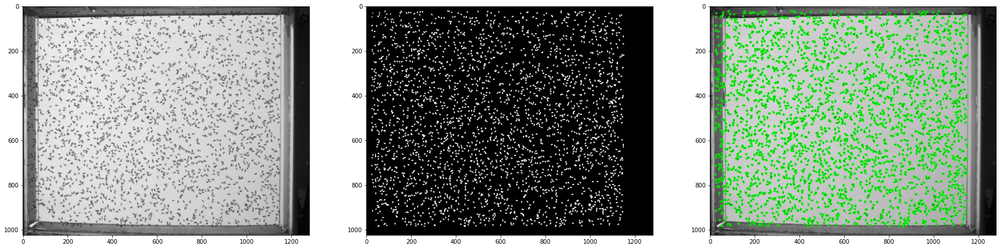

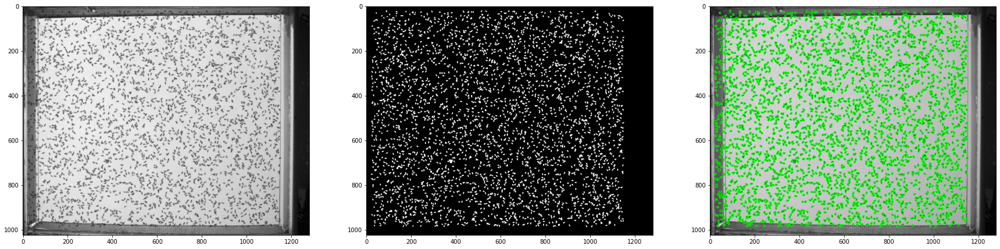

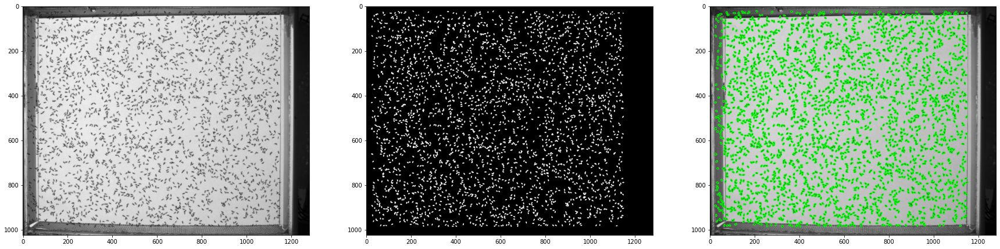

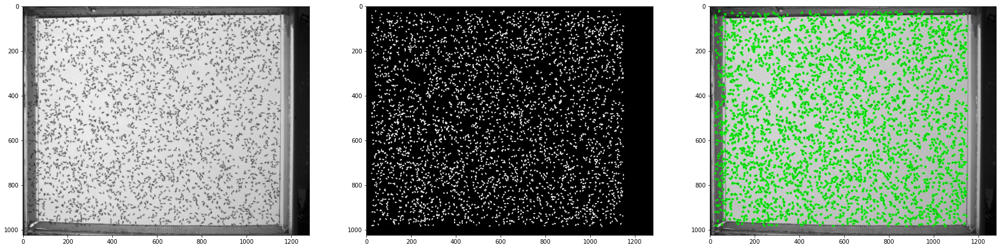

In [ ]:
from torchvision.transforms.functional import to_tensor,to_pil_image

for fn in test_ds:
  path2img = os.path.join(path2train,fn)
  img = Image.open(path2img)
  img = img.resize((w,h))
  img_t = to_tensor(img).unsqueeze(0).to(device)
  pred = model(img_t)[0]
  #pred = torch.sigmoid(pred)[0]
  #mask_pred = pred
  mask_pred = (pred[0] >= 0.5).to('cpu')


  plt.figure(figsize=(30,30))
  plt.subplot(1,3,1)
  plt.imshow(img,cmap  ='gray')

  plt.subplot(1,3,2)
  plt.imshow(mask_pred,cmap = 'gray')
  plt.subplot(1,3,3)
  show_img_mask(img,mask_pred)

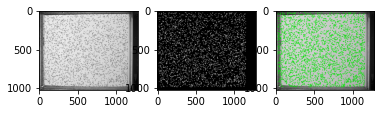

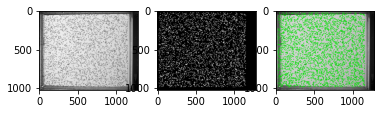

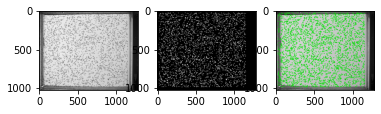

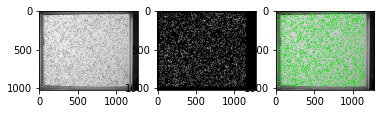

In [ ]:
from torchvision.transforms.functional import to_tensor,to_pil_image

test_ds= img_random
for fn in test_ds:
  path2img = os.path.join(path2train,fn)
  img = Image.open(path2img)
  img = img.resize((w,h))
  img_t = to_tensor(img).unsqueeze(0).to(device)
  pred = model(img_t)[0]
  #pred = torch.sigmoid(pred)[0]
  #mask_pred = pred
  mask_pred = (pred[0] >= 0.5).to('cpu')


  plt.figure()
  plt.subplot(1,3,1)
  plt.imshow(img,cmap  ='gray')

  plt.subplot(1,3,2)
  plt.imshow(mask_pred,cmap = 'gray')
  plt.subplot(1,3,3)
  show_img_mask(img,mask_pred)